Based on the 'activation maximization' technique suggested in [this](https://pdfs.semanticscholar.org/65d9/94fb778a8d9e0f632659fb33a082949a50d3.pdf) paper. 

We will view the layers of the (pretrained) GoogLeNet just like in [this](https://distill.pub/2017/feature-visualization/) post.

## Import useful libraries 

In [1]:
import torch

In [2]:
import numpy as np
import matplotlib.pyplot as plt

from torchvision import models

In [3]:
from torch import optim

In [4]:
import torch.nn as nn

In [5]:
import cv2 # for resizing images
# Note that we could have also used torchvision.transforms.Resize() method provided in Pytorch
# we used cv2 for no particular reason other than to try cv2
# for more info on torchvision.transforms.Resize() see https://pytorch.org/docs/stable/torchvision/transforms.html#torchvision.transforms.Resize

In [6]:
import sys # to use sys.exit() for terminating the code if nans arise during computations
           # See the discussion on the following stackoverflow post
           # https://stackoverflow.com/questions/19747371/python-exit-commands-why-so-many-and-when-should-each-be-used

In [7]:
torch.cuda.is_available()

True

## Import a pretrained GoogLeNet

In [8]:
model = models.googlenet(pretrained = True)

In [9]:
# names of the different layers in the model
list(map(lambda x: x[0], model.named_children()))

['conv1',
 'maxpool1',
 'conv2',
 'conv3',
 'maxpool2',
 'inception3a',
 'inception3b',
 'maxpool3',
 'inception4a',
 'inception4b',
 'inception4c',
 'inception4d',
 'inception4e',
 'maxpool4',
 'inception5a',
 'inception5b',
 'avgpool',
 'dropout',
 'fc']

In [10]:
# We now freeze the parameters of our pretrained model
for param in model.parameters():
    param.requires_grad_(False)

In [11]:
# components of the layer: inception4a
model.inception4a

Inception(
  (branch1): BasicConv2d(
    (conv): Conv2d(480, 192, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (branch2): Sequential(
    (0): BasicConv2d(
      (conv): Conv2d(480, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(96, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicConv2d(
      (conv): Conv2d(96, 208, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(208, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (branch3): Sequential(
    (0): BasicConv2d(
      (conv): Conv2d(480, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicConv2d(
      (conv): Conv2d(16, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): Batc

In [12]:
# We will register a forward hook to get the output of the layers

activation = {} # to store the activation  of a layer
def create_hook(name):
    def hook(m, i, o):
        # copy the output of the given layer
        activation[name] = o
       
    return hook


# register a forward hook for layer inception4a i.e. the first inception layer
model.inception4a.register_forward_hook(create_hook('4a'))

In [13]:
# normalize the input image to have appropriate mean and standard deviation as specified by pytorch
from torchvision import transforms



normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])


# undo the above normalization if and when the need arises 
denormalize = transforms.Normalize(mean = [-0.485/0.229, -0.456/0.224, -0.406/0.225],
                                   std = [1/0.229, 1/0.224, 1/0.225] )

In [14]:
# function to create an image with random pixels 
# and move it to the specified device i.e. cpu or gpu
# by default we will move the image to the 'cpu'
# the default will be to turn-off the requires_grad_ attribute of the image
def random_image(Height = 28, Width = 28, device = 'cpu', requires_grad=False, optimizer=None, lr = 0.01):
    img = np.single(np.random.uniform(0,1, (3, Height, Width))) # we need the pixel values to be of type float32
    im_tensor = normalize(torch.from_numpy(img)).to(device).requires_grad_(requires_grad) # normalize the image to have requisite mean and std. dev.
    print("img_shape:{}, img_dtype: {}".format(im_tensor.shape, im_tensor.dtype ))
    
    if optimizer:
        if requires_grad:
            return im_tensor, optimizer([im_tensor], lr = lr)
        else: 
            print('Error: Optimizer cannot be used on an image without setting its requires_grad_  ')
    
    return im_tensor

In [15]:
# function to massage img_tensor for using as input to plt.imshow()
def image_converter(im):
    
    # move the image to cpu
    im_copy = im.cpu()
    
    # for plt.imshow() the channel-dimension is the last
    # therefore use transpose to permute axes
    im_copy = denormalize(im_copy.clone().detach()).numpy().transpose(1,2,0)
    # clip negative values as plt.imshow() only accepts 
    # floating values in range [0,1] and integers in range [0,255]
    im_copy = im_copy.clip(0, 1) 
    
    return im_copy


## Trial 1: Naive Activation maximization

In this section we define the activation of a unit to be the mean of the elements in the output tensor produced by it.

### Create an input image 

The starting image will consist of random values for the pixels

In [15]:
# move the model and input image to the GPU (if available) 
# This should be done before defining an optimizer
# This is mentioned in the following pytorch page: https://pytorch.org/docs/master/optim.html
# Also see the discussion here: https://discuss.pytorch.org/t/effect-of-calling-model-cuda-after-constructing-an-optimizer/15165/7
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))
model.to(device)

# generating the initial image with random pixel values between 0 and 1
H = 224 # height of input image
W = 224 # width of input image
img_tensor, optimizer = random_image(Height = H, Width = W, device = device, 
                                     requires_grad = True, optimizer = optim.Adam, lr = 0.01)

# check that the model and img_tensor are on cuda or not
# https://discuss.pytorch.org/t/how-to-check-if-model-is-on-cuda/180
print('googlenet is on cuda: {}'.format(next(model.parameters()).is_cuda))
print('img_tensor is on cuda: {}'.format(img_tensor.is_cuda))

Calculations being executed on cuda
img_shape:torch.Size([3, 224, 224]), img_dtype: torch.float32
googlenet is on cuda: True
img_tensor is on cuda: True


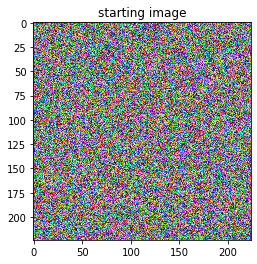

In [16]:
# Starting Image
plt.imshow(image_converter(img_tensor))                                                               
plt.title('starting image')
plt.show()

In [17]:
# understanding the shape of the output produced by a given layer
image = img_tensor.clone().detach().to(device).requires_grad_(True)
model(image.unsqueeze(0))
activation['4a'].shape

torch.Size([1, 512, 14, 14])

From above we see that the 'inception4a' layer of googlenet produces an output tensor having 512 channels with Height = Width = 14.

The 512 channels produced above can be understood as follows:

The inception4a layer consists of 4 independent branches whose output is collated along the batch dimension. 

 - 1) branch 1: This is basic 2d conv. layer consisting of 192 units. Thus it contributes 192 to the  number of channels in the final output
 
 
 - 2) branch 2: This is has two conv. layers applied sequentially. The second conv. layer contains 208 units. This branch therefore contributes 208 to the number of channels in the final output
 
 
 
 - 3) branch 3: This also has two conv. layers applied sequentially and contributes 48 to the number of channels in the final output
 
 
 
 - 4) branch 4: This has a maxpool layer followed by a 2d conv. layer. This branch contributes 64 to the final number of channels. 
 
We thus see that the total number of channels in the final output of 'inception4a' should be 192 + 208 + 48 + 64 = 512 which matches with the output of the previous cell.  

### Generating the final image maximizing a unit's output

epoch: 0/10000, activation: 0.019457995891571045


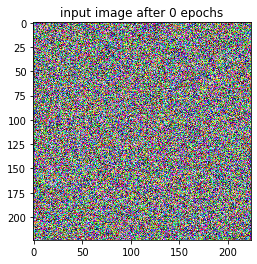

epoch: 1000/10000, activation: 28.712705612182617


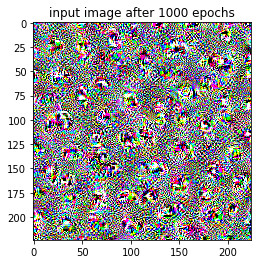

epoch: 2000/10000, activation: 48.82981872558594


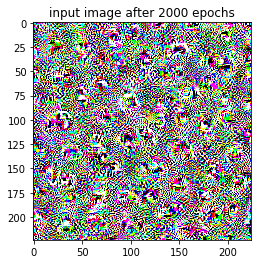

epoch: 3000/10000, activation: 70.09198760986328


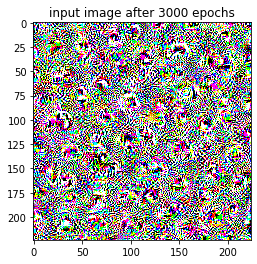

epoch: 4000/10000, activation: 92.0103530883789


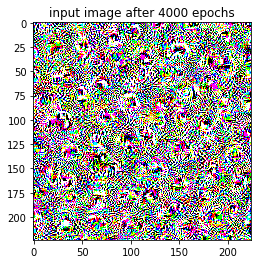

epoch: 5000/10000, activation: 114.24395751953125


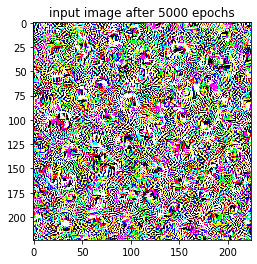

epoch: 6000/10000, activation: 136.86477661132812


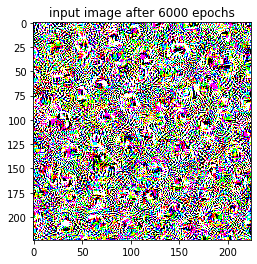

epoch: 7000/10000, activation: 159.60848999023438


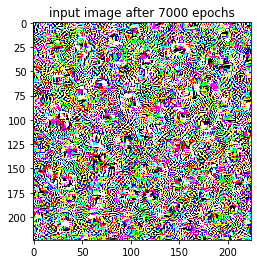

epoch: 8000/10000, activation: 182.34693908691406


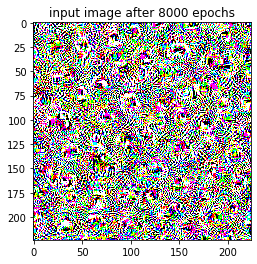

epoch: 9000/10000, activation: 205.26487731933594


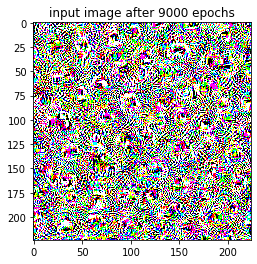

In [18]:
# Since we are not training googlenet here, therefore we should use evaluation mode 
# this is because batch-normalization layers in googlenet will have different behaviour in traning vs evaluation modes
model.eval()


num_epochs = 10000
display_every = 1000
unit_idx = 11 # unit of the convolution layer that we wish to visualize

for epoch in range(num_epochs):
    
    optimizer.zero_grad()
    model(img_tensor.unsqueeze(0))
    layer_out = activation['4a']
    loss = -layer_out[0, unit_idx].mean() 
    loss.backward()
    optimizer.step()
    # normalize the updated img_tensor to have pytorch specified mean and std. dev.
    # img_tensor = normalize(img_tensor.clone().detach()).requires_grad_(True)
    # the above step of renormalizing the updated img_tensor does not work: the activation remains frozen at ~ 2.368 and no patterns seem to develop in the image
    # Will have to understand this further  
    
    if epoch % display_every == 0:
        print('epoch: {}/{}, activation: {}'.format(epoch, num_epochs, -loss))
        plt.imshow(image_converter(img_tensor))
        plt.title('input image after {} epochs'.format(epoch))
        plt.show()


The final image does seeem to have some very high frequency patterns. However, the high frequency behaviour obscures any interpretation of what the neuron seems to learning. 

## Trial 2: Activation Maximization with slowly upscaling the image

I found that my code above is quite similar to the implementation of feature visualization with activation maximization in [this](https://towardsdatascience.com/how-to-visualize-convolutional-features-in-40-lines-of-code-70b7d87b0030) blog post. There the author also discusses the emerges of high frequence patterns in the image and how he got around it by initially feeding smaller sized images and slowing upscaling them. Let us try this.

In [15]:
# e.g. of how to resize images using cv2
# just like in plt.imshow() cv2 also expects the channel info. to be in the last axis
# the documentation for cv2.resize() recommends using inter_cubic for interpolation when upscaling
img = random_image()
upscaling_factor = 1.05
rescaled_img = cv2.resize(image_converter(img), dsize = (0,0) ,
                          fx = upscaling_factor, fy = upscaling_factor, 
                          interpolation = cv2.INTER_CUBIC)
print('shape of rescaled image: {}'.format(rescaled_img.shape))

img_shape:torch.Size([3, 28, 28]), img_dtype: torch.float32
shape of rescaled image: (29, 29, 3)


### Creating a initial image with random pixels

In [16]:
# move the model and input image to the GPU (if available) 
# This should be done before defining an optimizer
# This is mentioned in the following pytorch page: https://pytorch.org/docs/master/optim.html
# Also see the discussion here: https://discuss.pytorch.org/t/effect-of-calling-model-cuda-after-constructing-an-optimizer/15165/7
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))

model.to(device)

# initial random image
H = 28 # height of image
W = 28 # width of image
img_tensor, optimizer = random_image(Height = H, Width = W, device = device, 
                                     requires_grad = True, optimizer = optim.Adam, lr = 0.01 )

# check that the model and img_tensor are on cuda or not
# https://discuss.pytorch.org/t/how-to-check-if-model-is-on-cuda/180
print('googlenet is on cuda: {}'.format(next(model.parameters()).is_cuda))
print('img_tensor is on cuda: {}'.format(img_tensor.is_cuda))

Calculations being executed on cuda
img_shape:torch.Size([3, 28, 28]), img_dtype: torch.float32
googlenet is on cuda: True
img_tensor is on cuda: True


### Generating the final image 

begin mag_epoch 0, activation: 0.6678405404090881
end mag_epoch: 0, activation: 21.551551818847656


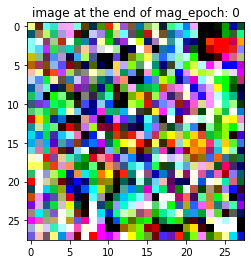

begin mag_epoch 1, activation: 7.497994899749756
end mag_epoch: 1, activation: 28.816152572631836


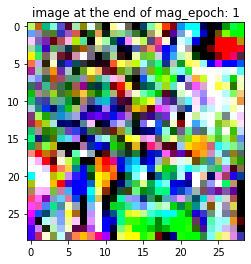

begin mag_epoch 2, activation: 8.468682289123535
end mag_epoch: 2, activation: 37.61054611206055


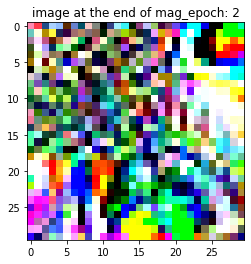

begin mag_epoch 3, activation: 4.336645126342773
end mag_epoch: 3, activation: 25.518367767333984


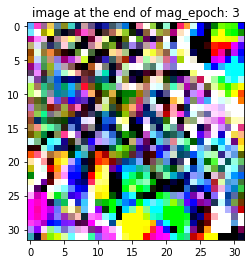

begin mag_epoch 4, activation: 5.559968948364258
end mag_epoch: 4, activation: 27.797332763671875


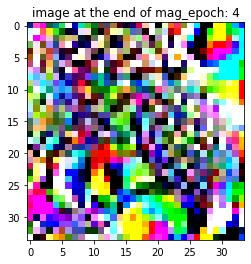

begin mag_epoch 5, activation: 6.347953796386719
end mag_epoch: 5, activation: 29.567279815673828


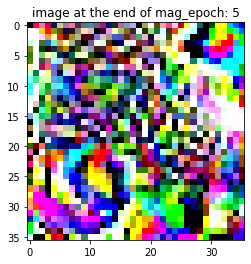

begin mag_epoch 6, activation: 5.536744117736816
end mag_epoch: 6, activation: 32.680381774902344


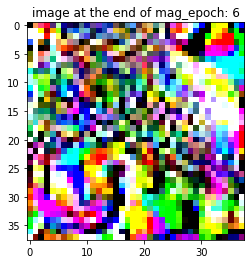

begin mag_epoch 7, activation: 4.669521808624268
end mag_epoch: 7, activation: 33.22748565673828


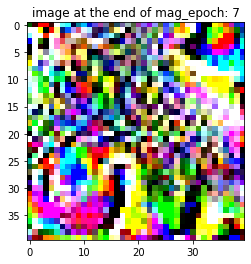

begin mag_epoch 8, activation: 7.343846321105957
end mag_epoch: 8, activation: 36.785858154296875


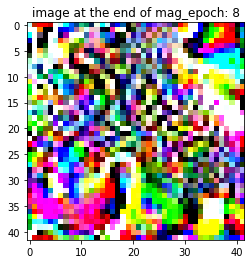

begin mag_epoch 9, activation: 7.415051460266113
end mag_epoch: 9, activation: 39.98362350463867


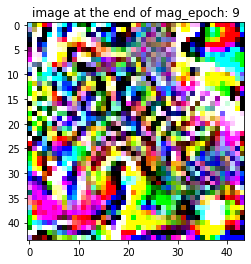

begin mag_epoch 10, activation: 8.382621765136719
end mag_epoch: 10, activation: 40.09017562866211


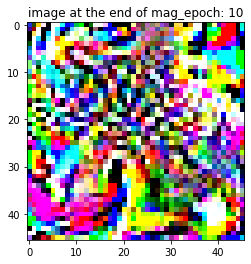

begin mag_epoch 11, activation: 4.556065082550049
end mag_epoch: 11, activation: 26.843286514282227


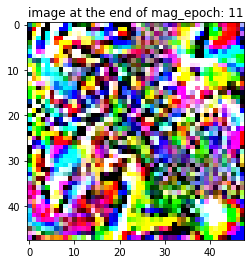

begin mag_epoch 12, activation: 5.078816890716553
end mag_epoch: 12, activation: 28.309778213500977


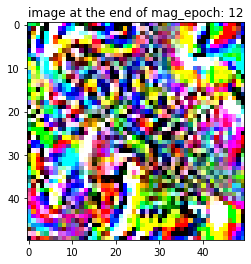

begin mag_epoch 13, activation: 6.550782203674316
end mag_epoch: 13, activation: 30.66752052307129


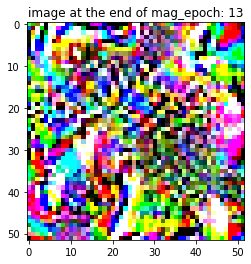

begin mag_epoch 14, activation: 5.5354461669921875
end mag_epoch: 14, activation: 30.740447998046875


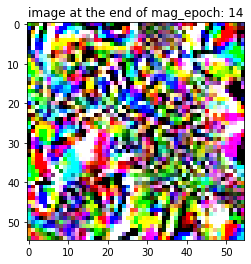

begin mag_epoch 15, activation: 6.318504810333252
end mag_epoch: 15, activation: 32.115966796875


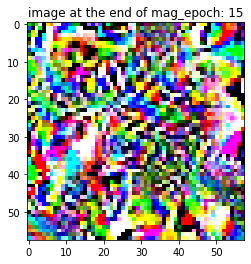

begin mag_epoch 16, activation: 6.051878452301025
end mag_epoch: 16, activation: 33.57692337036133


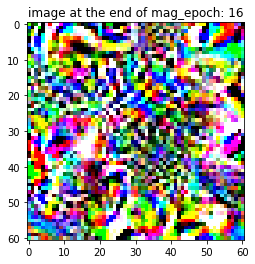

begin mag_epoch 17, activation: 4.035409927368164
end mag_epoch: 17, activation: 27.848363876342773


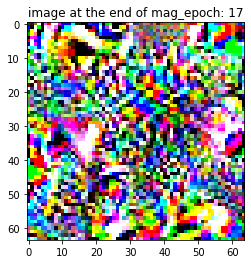

begin mag_epoch 18, activation: 5.259316444396973
end mag_epoch: 18, activation: 30.469440460205078


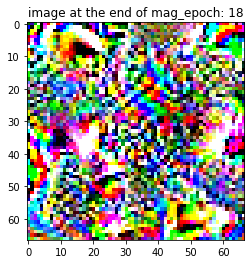

begin mag_epoch 19, activation: 6.268613815307617
end mag_epoch: 19, activation: 32.695003509521484


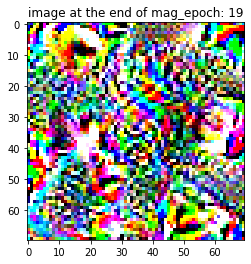

begin mag_epoch 20, activation: 6.000923156738281
end mag_epoch: 20, activation: 33.227386474609375


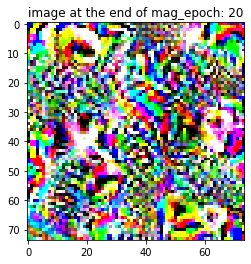

begin mag_epoch 21, activation: 6.332136631011963
end mag_epoch: 21, activation: 36.137420654296875


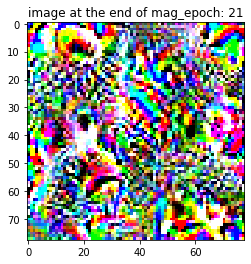

begin mag_epoch 22, activation: 4.982789516448975
end mag_epoch: 22, activation: 31.42923927307129


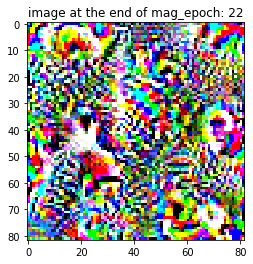

begin mag_epoch 23, activation: 5.598811626434326
end mag_epoch: 23, activation: 34.32755661010742


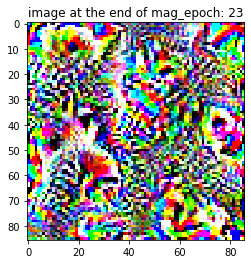

begin mag_epoch 24, activation: 5.947033405303955
end mag_epoch: 24, activation: 32.93293762207031


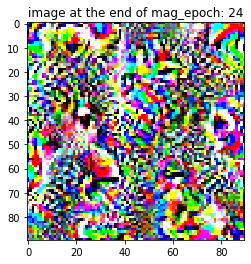

begin mag_epoch 25, activation: 6.222261905670166
end mag_epoch: 25, activation: 35.081199645996094


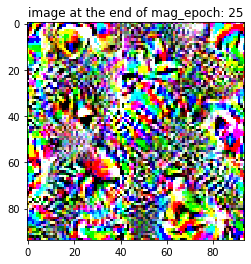

begin mag_epoch 26, activation: 5.707823276519775
end mag_epoch: 26, activation: 29.79450225830078


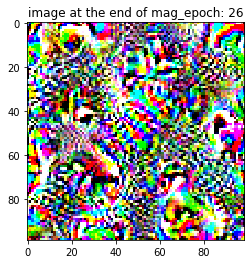

begin mag_epoch 27, activation: 5.288021564483643
end mag_epoch: 27, activation: 30.438385009765625


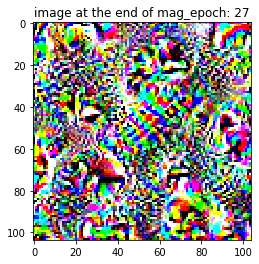

begin mag_epoch 28, activation: 5.36899995803833
end mag_epoch: 28, activation: 31.29929542541504


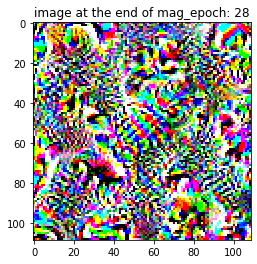

begin mag_epoch 29, activation: 4.758367538452148
end mag_epoch: 29, activation: 29.085323333740234


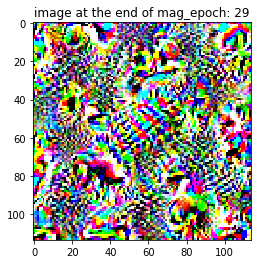

begin mag_epoch 30, activation: 4.869354248046875
end mag_epoch: 30, activation: 30.000089645385742


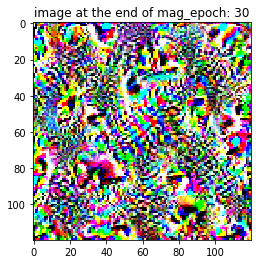

begin mag_epoch 31, activation: 5.091845512390137
end mag_epoch: 31, activation: 31.72589874267578


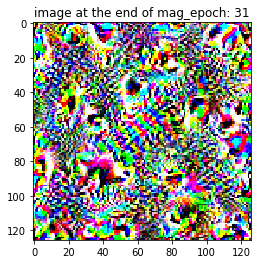

begin mag_epoch 32, activation: 4.526639461517334
end mag_epoch: 32, activation: 29.91732406616211


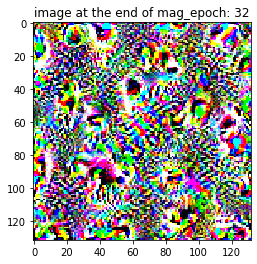

begin mag_epoch 33, activation: 4.948731422424316
end mag_epoch: 33, activation: 30.40525245666504


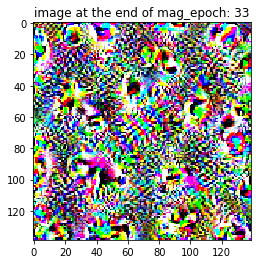

begin mag_epoch 34, activation: 4.628707408905029
end mag_epoch: 34, activation: 29.898420333862305


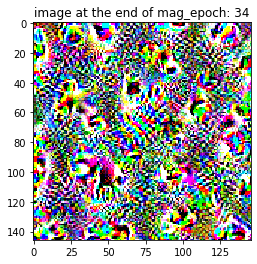

begin mag_epoch 35, activation: 5.010066509246826
end mag_epoch: 35, activation: 31.152111053466797


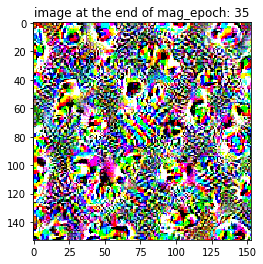

begin mag_epoch 36, activation: 4.79368257522583
end mag_epoch: 36, activation: 29.986087799072266


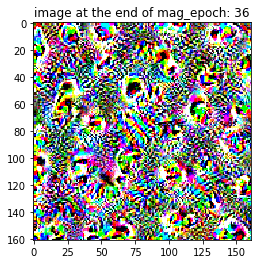

begin mag_epoch 37, activation: 4.958981990814209
end mag_epoch: 37, activation: 30.48464012145996


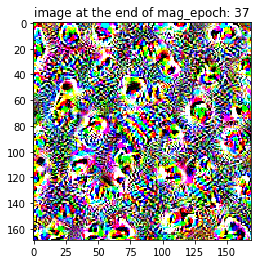

begin mag_epoch 38, activation: 5.035438060760498
end mag_epoch: 38, activation: 31.212749481201172


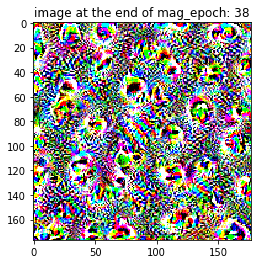

begin mag_epoch 39, activation: 5.101695537567139
end mag_epoch: 39, activation: 31.729047775268555


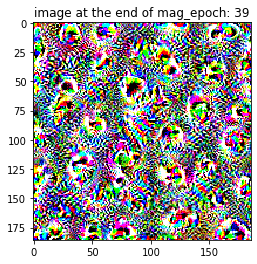

begin mag_epoch 40, activation: 4.820953845977783
end mag_epoch: 40, activation: 30.619815826416016


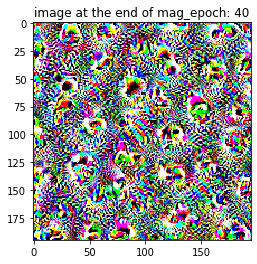

begin mag_epoch 41, activation: 5.159958839416504
end mag_epoch: 41, activation: 31.89084243774414


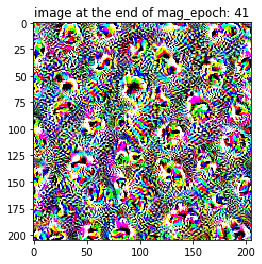

begin mag_epoch 42, activation: 5.013040065765381
end mag_epoch: 42, activation: 30.59263801574707


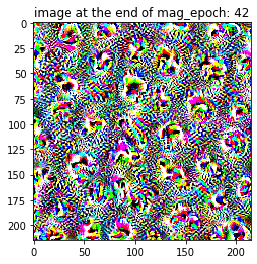

begin mag_epoch 43, activation: 4.868893146514893
end mag_epoch: 43, activation: 29.844070434570312


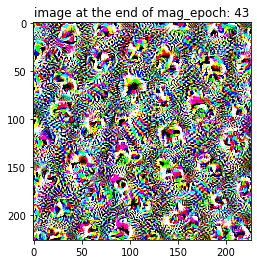

begin mag_epoch 44, activation: 4.961428642272949
end mag_epoch: 44, activation: 30.558198928833008


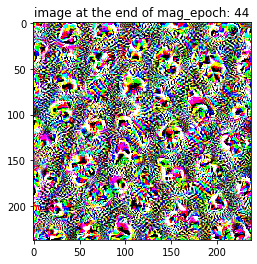

begin mag_epoch 45, activation: 5.017393589019775
end mag_epoch: 45, activation: 29.905839920043945


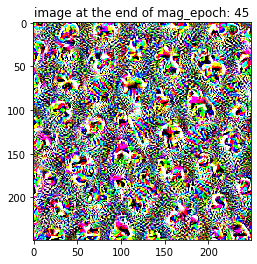

In [17]:
unit_idx = 11 # the neuron to visualize

upscaling_steps = 45 # no. of times to upscale
upscaling_factor = 1.05
optim_steps = 20 # no. of times to optimize an input image before upscaling

model.eval()
for mag_epoch in range(upscaling_steps+1):
    optimizer = optim.Adam([img_tensor], lr = 0.4)
    
    for opt_epoch in range(optim_steps):
        optimizer.zero_grad()
        model(img_tensor.unsqueeze(0))
        layer_out = activation['4a']
        loss = -layer_out[0, unit_idx].mean()
        # print activation at the beginning of each mag_epoch
        if opt_epoch == 0:
            print('begin mag_epoch {}, activation: {}'.format(mag_epoch, -loss))
        loss.backward()
        optimizer.step()
        
    # view the result of optimising the image
    print('end mag_epoch: {}, activation: {}'.format(mag_epoch, -loss))
    img = image_converter(img_tensor)    
    plt.imshow(img)
    plt.title('image at the end of mag_epoch: {}'.format(mag_epoch))
    plt.show()
    
    img = cv2.resize(img, dsize = (0,0), 
                     fx = upscaling_factor, fy = upscaling_factor).transpose(2,0,1) # scale up and move the batch axis to be the first
    img_tensor = normalize(torch.from_numpy(img)).to(device).requires_grad_(True)

In [18]:
img_tensor.shape

torch.Size([3, 261, 261])

Simply scaling up the image slowly does not seem ameliorate the issue :(

## Trial 3: Activation maximization with RMS activation

In my experiments so far, I had defined activation of a unit to be the average of the elements in the output tensor of that unit. Loss was then defined to be the negative of this activation. Let me consider a new definition of activation: root-mean-squared value of the elements in the output tensor.

### Generating an inital random image

In [15]:
# move the model and input image to the GPU (if available) 
# This should be done before defining an optimizer
# This is mentioned in the following pytorch page: https://pytorch.org/docs/master/optim.html
# Also see the discussion here: https://discuss.pytorch.org/t/effect-of-calling-model-cuda-after-constructing-an-optimizer/15165/7
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))

model.to(device)

# initial random image
H = 224 # height of image
W = 224 # width of image
img_tensor, optimizer = random_image(Height = H, Width = W, device = device, 
                                     requires_grad = True, optimizer = optim.Adam, lr = 0.01 )

# check that the model and img_tensor are on cuda or not
# https://discuss.pytorch.org/t/how-to-check-if-model-is-on-cuda/180
print('googlenet is on cuda: {}'.format(next(model.parameters()).is_cuda))
print('img_tensor is on cuda: {}'.format(img_tensor.is_cuda))

Calculations being executed on cuda
img_shape:torch.Size([3, 224, 224]), img_dtype: torch.float32
googlenet is on cuda: True
img_tensor is on cuda: True


### Generating the final image

epoch: 0/10000, activation: 0.022666221484541893


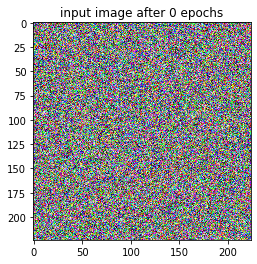

epoch: 1000/10000, activation: 33.014366149902344


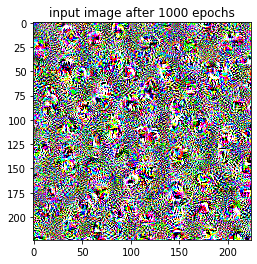

epoch: 2000/10000, activation: 57.01138687133789


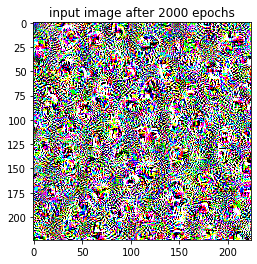

epoch: 3000/10000, activation: 81.79684448242188


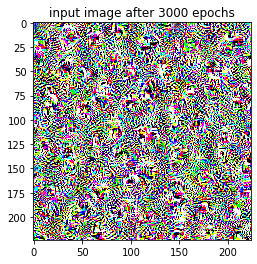

epoch: 4000/10000, activation: 107.32771301269531


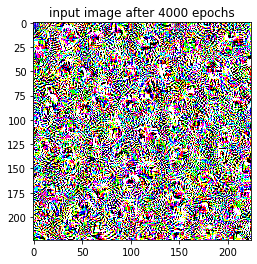

epoch: 5000/10000, activation: 133.51438903808594


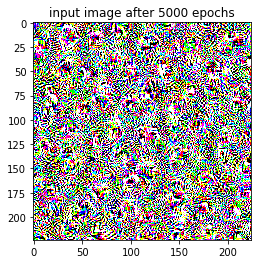

epoch: 6000/10000, activation: 159.76881408691406


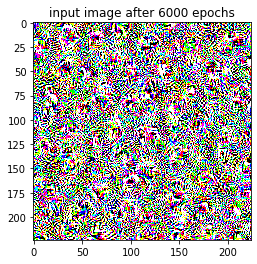

epoch: 7000/10000, activation: 186.0839080810547


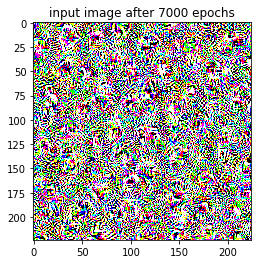

epoch: 8000/10000, activation: 212.65652465820312


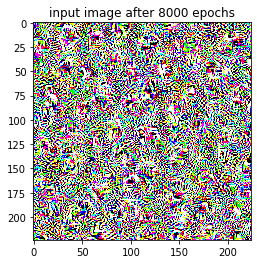

epoch: 9000/10000, activation: 239.52186584472656


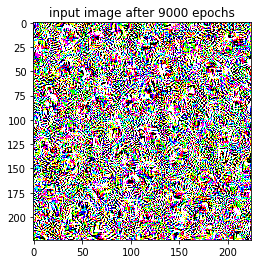

In [16]:
# Since we are not training googlenet here, therefore we should use evaluation mode 
# this is because batch-normalization layers in googlenet will have different behaviour in traning vs evaluation modes
model.eval()


num_epochs = 10000
display_every = 1000
unit_idx = 11 # unit of the convolution layer that we wish to visualize

for epoch in range(num_epochs):
    
    optimizer.zero_grad()
    model(img_tensor.unsqueeze(0))
    layer_out = activation['4a']
    rms = torch.pow(torch.pow(layer_out[0, unit_idx],2).mean(), 0.5)
    loss = - rms
    loss.backward()
    optimizer.step()
    # normalize the updated img_tensor to have pytorch specified mean and std. dev.
    # img_tensor = normalize(img_tensor.clone().detach()).requires_grad_(True)
    # the above step of renormalizing the updated img_tensor does not work: the activation remains frozen at ~ 2.368 and no patterns seem to develop in the image
    # Will have to understand this further  
    
    if epoch % display_every == 0:
        print('epoch: {}/{}, activation: {}'.format(epoch, num_epochs, -loss))
        plt.imshow(image_converter(img_tensor))
        plt.title('input image after {} epochs'.format(epoch))
        plt.show()

This does not help either!

## Trial 4: Activation Maximization with Regularization

Various papers such as [this](https://arxiv.org/pdf/1312.6034.pdf), [this](https://arxiv.org/pdf/1512.02017.pdf) and [this](https://arxiv.org/pdf/1904.08939.pdf) have stressed on the need for regularization in order to obtain interpretable results from activation maximization. For starters, let's try an L2-regularization on pixel values as was done in [this](https://arxiv.org/pdf/1312.6034.pdf) paper. 

Calculations being executed on cuda
img_shape:torch.Size([3, 224, 224]), img_dtype: torch.float32
Optimization for pixel regularization constant: 0, initial activation: 0.049354277551174164
pixel regularization constant: 0, activation: 16.472454071044922


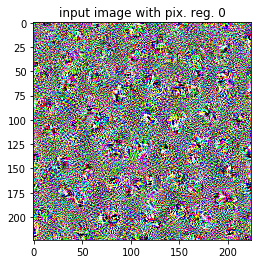

img_shape:torch.Size([3, 224, 224]), img_dtype: torch.float32
Optimization for pixel regularization constant: 5, initial activation: 0.05305471643805504
pixel regularization constant: 5, activation: 14.4601411819458


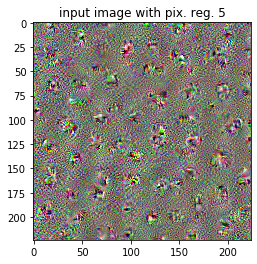

img_shape:torch.Size([3, 224, 224]), img_dtype: torch.float32
Optimization for pixel regularization constant: 10, initial activation: 0.06351755559444427
pixel regularization constant: 10, activation: 13.187471389770508


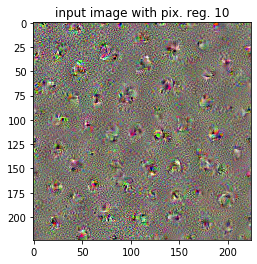

img_shape:torch.Size([3, 224, 224]), img_dtype: torch.float32
Optimization for pixel regularization constant: 15, initial activation: 0.03856742009520531
pixel regularization constant: 15, activation: 12.608255386352539


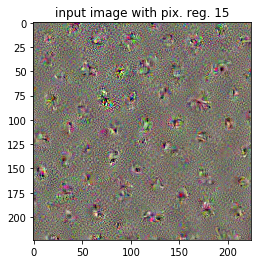

img_shape:torch.Size([3, 224, 224]), img_dtype: torch.float32
Optimization for pixel regularization constant: 20, initial activation: 0.0684199184179306
pixel regularization constant: 20, activation: 12.117338180541992


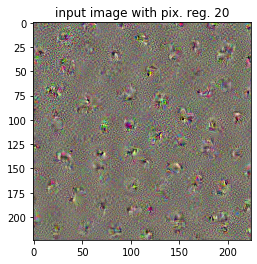

img_shape:torch.Size([3, 224, 224]), img_dtype: torch.float32
Optimization for pixel regularization constant: 25, initial activation: 0.08420829474925995
pixel regularization constant: 25, activation: 11.871319770812988


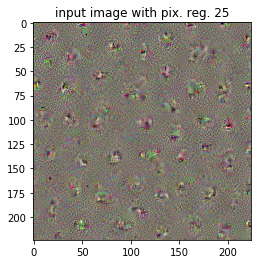

img_shape:torch.Size([3, 224, 224]), img_dtype: torch.float32
Optimization for pixel regularization constant: 30, initial activation: 0.033058833330869675
pixel regularization constant: 30, activation: 11.441019058227539


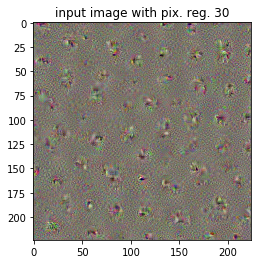

In [15]:
# move the model and input image to the GPU (if available) 
# This should be done before defining an optimizer
# This is mentioned in the following pytorch page: https://pytorch.org/docs/master/optim.html
# Also see the discussion here: https://discuss.pytorch.org/t/effect-of-calling-model-cuda-after-constructing-an-optimizer/15165/7
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))

model.to(device)

# Since we are not training googlenet here, therefore we should use evaluation mode 
# this is because batch-normalization layers in googlenet will have different behaviour in traning vs evaluation modes
model.eval()


num_epochs = 300
unit_idx = 11 # unit of the convolution layer that we wish to visualize
pix_reg_high = 30 # upper bound on regularization constants for pixel intensities
pix_reg_step = 5 # step size by which to increase pixel regularizer in each step
lr = 0.01 # learning rate 
H = 224
W = 224

for pix_reg in range(0, pix_reg_high+1, pix_reg_step):
    image, optimizer = random_image(Height = H, Width = W, device = device,
                                    requires_grad = True, optimizer = optim.Adam, lr = lr)
    
    # act. value before optimization
    optimizer.zero_grad()
    model(image.unsqueeze(0))
    layer_out = activation['4a']
    rms = torch.pow(torch.pow(layer_out[0, unit_idx],2).mean(), 0.5)
    print('Optimization for pixel regularization constant: {}, initial activation: {}'.format(pix_reg, rms))
    
    for epoch in range(num_epochs):
        optimizer.zero_grad()
        model(image.unsqueeze(0))
        layer_out = activation['4a']
        rms = torch.pow(torch.pow(layer_out[0, unit_idx],2).mean(), 0.5)
        loss = - rms + pix_reg*((image**2).mean())
        loss.backward()
        optimizer.step()
        # normalize the updated img_tensor to have pytorch specified mean and std. dev.
        # img_tensor = normalize(img_tensor.clone().detach()).requires_grad_(True)
        # the above step of renormalizing the updated img_tensor does not work: the activation remains frozen at ~ 2.368 and no patterns seem to develop in the image
        # Will have to understand this further  
    
    # display the image generated for each value of pix_reg  
    print('pixel regularization constant: {}, activation: {}'.format(pix_reg, rms))
    plt.imshow(image_converter(image))
    plt.title('input image with pix. reg. {}'.format(pix_reg))
    plt.show()

Just adding an L2 regularizer for pixel intensities also does not seem to help much, except that it suppresses the background of the final image. 

## Trial 5: Activation Maximization with scaling and L2 reg. for pixel intensity

Let us try to combine the techniques in Trial 2 and 4

### Creating a initial image with random pixels

In [15]:
# move the model and input image to the GPU (if available) 
# This should be done before defining an optimizer
# This is mentioned in the following pytorch page: https://pytorch.org/docs/master/optim.html
# Also see the discussion here: https://discuss.pytorch.org/t/effect-of-calling-model-cuda-after-constructing-an-optimizer/15165/7
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))

model.to(device)

# initial random image
H = 28 # height of image
W = 28 # width of image
img_tensor = random_image(Height = H, Width = W, device = device, requires_grad = True ) # we will define an optimizer later, inside the training loop

# check that the model and img_tensor are on cuda or not
# https://discuss.pytorch.org/t/how-to-check-if-model-is-on-cuda/180
print('googlenet is on cuda: {}'.format(next(model.parameters()).is_cuda))
print('img_tensor is on cuda: {}'.format(img_tensor.is_cuda))

Calculations being executed on cuda
img_shape:torch.Size([3, 28, 28]), img_dtype: torch.float32
googlenet is on cuda: True
img_tensor is on cuda: True


### Generating the final image 

begin mag_epoch 0, activation: -16.861297607421875
end mag_epoch: 0, activation: 12.853557586669922


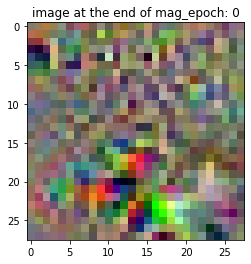

begin mag_epoch 1, activation: 6.918788909912109
end mag_epoch: 1, activation: 15.849157333374023


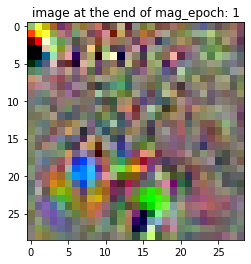

begin mag_epoch 2, activation: 8.601274490356445
end mag_epoch: 2, activation: 16.214900970458984


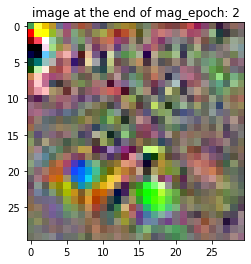

begin mag_epoch 3, activation: 2.5315005779266357
end mag_epoch: 3, activation: 11.689459800720215


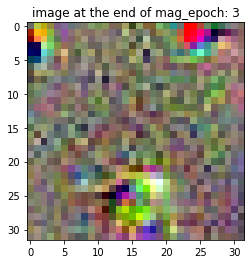

begin mag_epoch 4, activation: 6.103752613067627
end mag_epoch: 4, activation: 12.336809158325195


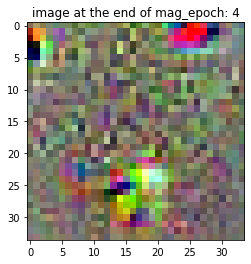

begin mag_epoch 5, activation: 5.4353461265563965
end mag_epoch: 5, activation: 13.817028999328613


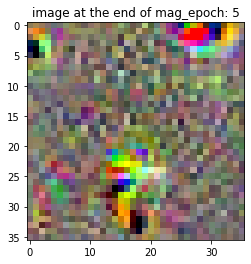

begin mag_epoch 6, activation: 6.248620986938477
end mag_epoch: 6, activation: 14.422626495361328


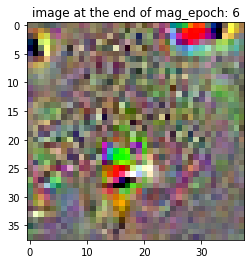

begin mag_epoch 7, activation: 5.206365585327148
end mag_epoch: 7, activation: 15.040645599365234


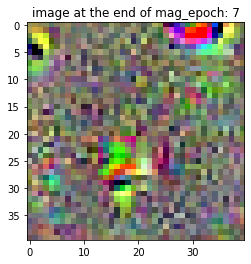

begin mag_epoch 8, activation: 5.108272552490234
end mag_epoch: 8, activation: 17.956438064575195


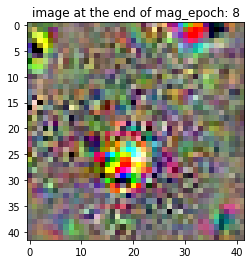

begin mag_epoch 9, activation: 5.012670516967773
end mag_epoch: 9, activation: 18.73405647277832


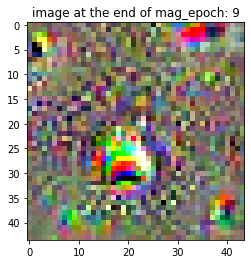

begin mag_epoch 10, activation: 4.800731182098389
end mag_epoch: 10, activation: 20.380952835083008


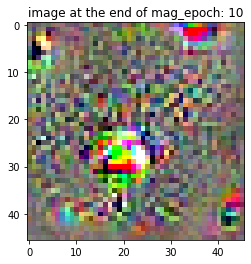

begin mag_epoch 11, activation: 2.33475923538208
end mag_epoch: 11, activation: 15.562885284423828


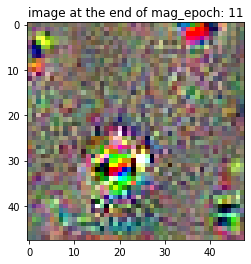

begin mag_epoch 12, activation: 4.507659435272217
end mag_epoch: 12, activation: 16.34271240234375


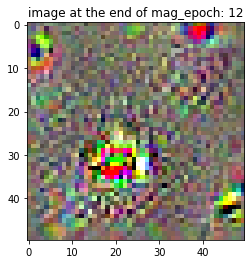

begin mag_epoch 13, activation: 3.4831254482269287
end mag_epoch: 13, activation: 17.27202033996582


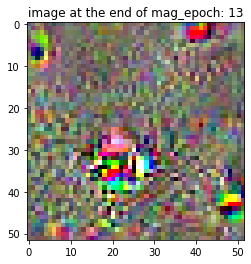

begin mag_epoch 14, activation: 3.110550880432129
end mag_epoch: 14, activation: 15.148036003112793


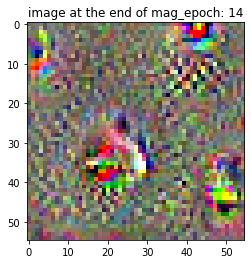

begin mag_epoch 15, activation: 4.812132358551025
end mag_epoch: 15, activation: 15.665977478027344


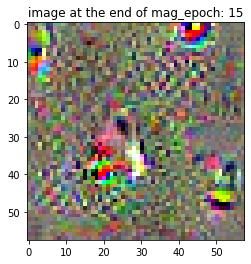

begin mag_epoch 16, activation: 3.9058117866516113
end mag_epoch: 16, activation: 16.75855255126953


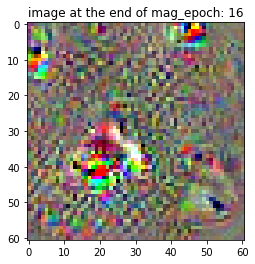

begin mag_epoch 17, activation: 2.3580331802368164
end mag_epoch: 17, activation: 14.24321174621582


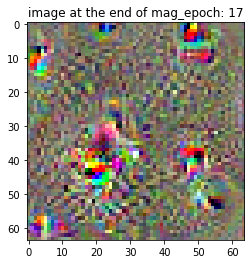

begin mag_epoch 18, activation: 3.1163628101348877
end mag_epoch: 18, activation: 16.446956634521484


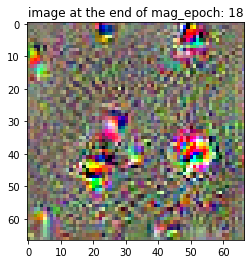

begin mag_epoch 19, activation: 3.200181007385254
end mag_epoch: 19, activation: 17.63031578063965


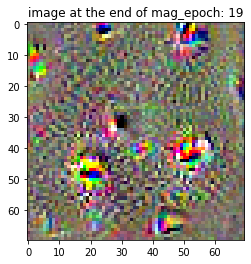

begin mag_epoch 20, activation: 3.360846519470215
end mag_epoch: 20, activation: 18.56606674194336


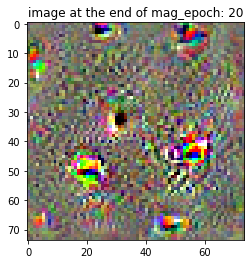

begin mag_epoch 21, activation: 3.6049604415893555
end mag_epoch: 21, activation: 18.671249389648438


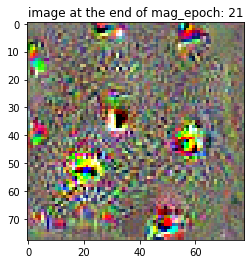

begin mag_epoch 22, activation: 2.637843132019043
end mag_epoch: 22, activation: 16.03011703491211


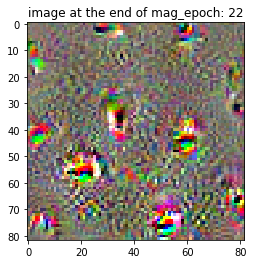

begin mag_epoch 23, activation: 3.5977110862731934
end mag_epoch: 23, activation: 15.795588493347168


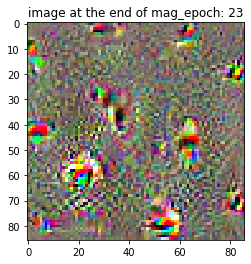

begin mag_epoch 24, activation: 3.9794836044311523
end mag_epoch: 24, activation: 16.329814910888672


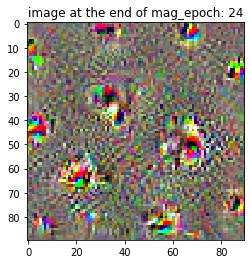

begin mag_epoch 25, activation: 3.88724422454834
end mag_epoch: 25, activation: 16.78935432434082


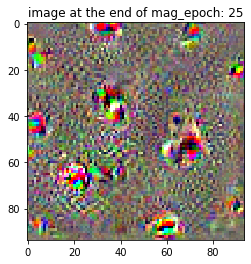

begin mag_epoch 26, activation: 3.1948046684265137
end mag_epoch: 26, activation: 15.302217483520508


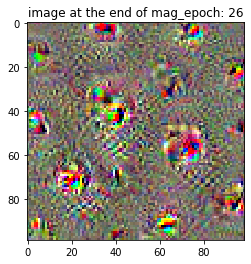

begin mag_epoch 27, activation: 3.2987756729125977
end mag_epoch: 27, activation: 16.41649627685547


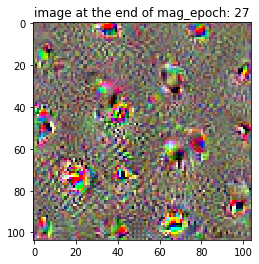

begin mag_epoch 28, activation: 3.8701486587524414
end mag_epoch: 28, activation: 17.791507720947266


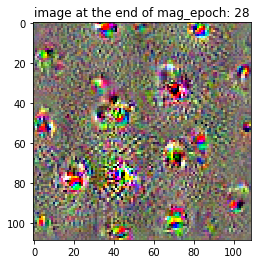

begin mag_epoch 29, activation: 2.7171037197113037
end mag_epoch: 29, activation: 15.860297203063965


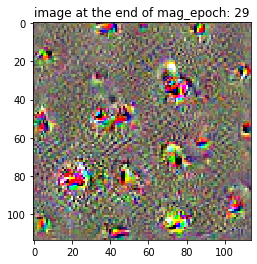

begin mag_epoch 30, activation: 3.090259313583374
end mag_epoch: 30, activation: 15.824589729309082


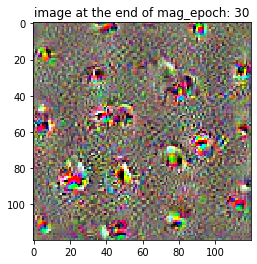

begin mag_epoch 31, activation: 3.3871405124664307
end mag_epoch: 31, activation: 17.556529998779297


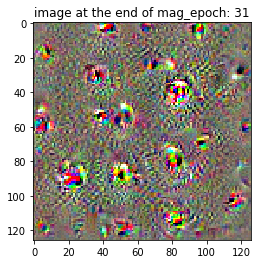

begin mag_epoch 32, activation: 2.5325357913970947
end mag_epoch: 32, activation: 16.118927001953125


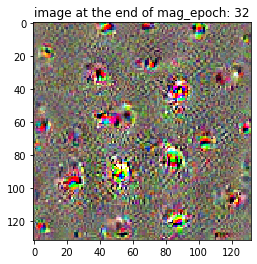

begin mag_epoch 33, activation: 3.1200900077819824
end mag_epoch: 33, activation: 17.014646530151367


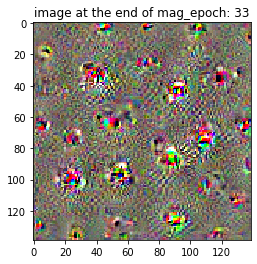

begin mag_epoch 34, activation: 2.2879128456115723
end mag_epoch: 34, activation: 15.740621566772461


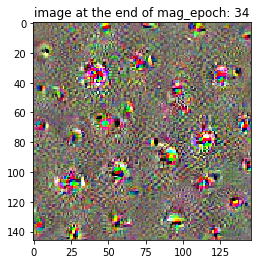

begin mag_epoch 35, activation: 2.7591376304626465
end mag_epoch: 35, activation: 17.448726654052734


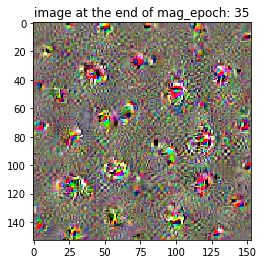

begin mag_epoch 36, activation: 2.437026262283325
end mag_epoch: 36, activation: 15.856466293334961


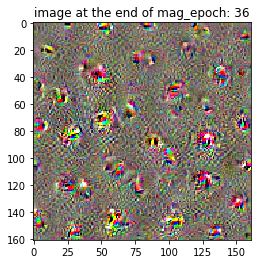

begin mag_epoch 37, activation: 3.0964009761810303
end mag_epoch: 37, activation: 16.85987663269043


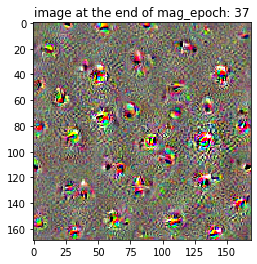

begin mag_epoch 38, activation: 3.4046759605407715
end mag_epoch: 38, activation: 16.399139404296875


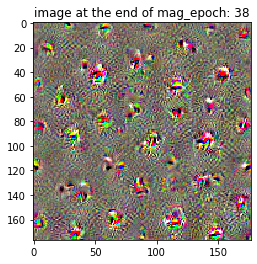

begin mag_epoch 39, activation: 3.413433313369751
end mag_epoch: 39, activation: 17.25381088256836


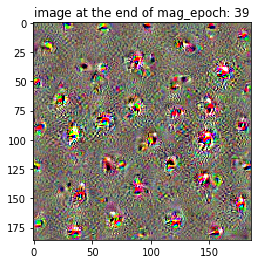

begin mag_epoch 40, activation: 2.9122188091278076
end mag_epoch: 40, activation: 16.28784942626953


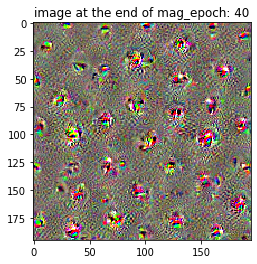

begin mag_epoch 41, activation: 3.143451452255249
end mag_epoch: 41, activation: 17.34328842163086


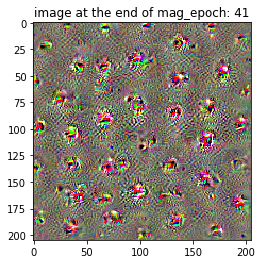

begin mag_epoch 42, activation: 2.693208694458008
end mag_epoch: 42, activation: 16.827058792114258


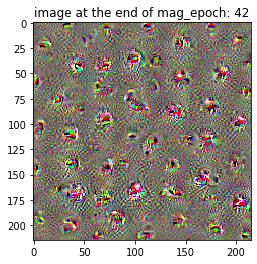

begin mag_epoch 43, activation: 2.7398698329925537
end mag_epoch: 43, activation: 16.39366912841797


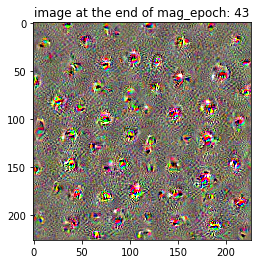

begin mag_epoch 44, activation: 2.8095033168792725
end mag_epoch: 44, activation: 17.130512237548828


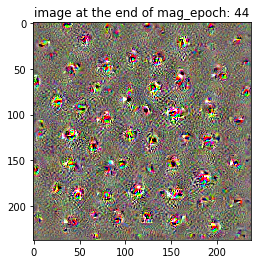

begin mag_epoch 45, activation: 2.7631492614746094
end mag_epoch: 45, activation: 17.293184280395508


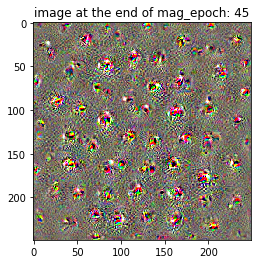

In [16]:
unit_idx = 11 # the neuron to visualize


upscaling_steps = 45 # no. of times to upscale
upscaling_factor = 1.05
optim_steps = 50 # no. of times to optimize an input image before upscaling
pix_reg = 10

model.eval()
for mag_epoch in range(upscaling_steps+1):
    optimizer = optim.Adam([img_tensor], lr = 0.4)
    
    for opt_epoch in range(optim_steps):
        optimizer.zero_grad()
        model(img_tensor.unsqueeze(0))
        layer_out = activation['4a']
        rms = torch.pow((layer_out[0, unit_idx]**2).mean(), 0.5)
        loss = -rms + pix_reg*((img_tensor**2).mean())
        # print activation at the beginning of each mag_epoch
        if opt_epoch == 0:
            print('begin mag_epoch {}, activation: {}'.format(mag_epoch, -loss))
        loss.backward()
        optimizer.step()
        
    # view the result of optimising the image
    print('end mag_epoch: {}, activation: {}'.format(mag_epoch, -loss))
    img = image_converter(img_tensor)    
    plt.imshow(img)
    plt.title('image at the end of mag_epoch: {}'.format(mag_epoch))
    plt.show()
    
    img = cv2.resize(img, dsize = (0,0), 
                     fx = upscaling_factor, fy = upscaling_factor).transpose(2,0,1) # scale up and move the batch axis to be the first
    img_tensor = normalize(torch.from_numpy(img)).to(device).requires_grad_(True)

In [17]:
img_tensor.shape

torch.Size([3, 261, 261])

### Trial 6: Regularizing image gradients

As advocated in [this](https://arxiv.org/pdf/1412.0035.pdf) in this paper, regularizing the gradients in the image helps produce more human interpretable structures.

### Computing image gradients for a gray scale image with a single color channel

In [16]:
# Use cv2 to compute image gradients
# This is to verify our implementation of image gradients using conv. layers
# We can not be use these during backpropagation, hence the need to define our own function
# Due to differences in how boundary pixels are handled we only expect the results to match for non-boundary pixels


# function to compute image gradients using cv2
# we will make use of the Scharr filters provided in cv2
# the image passed to this function is supposed to have the color channels as its first dimension
def image_gradients(img):
    num_channels = img.shape[0]
    ddepth = cv2.CV_64F
    x_grad = []
    y_grad = []
    for chnl in range(num_channels):
        x_grad.append(cv2.Scharr(img[chnl], ddepth, dx = 1, dy = 0))
        y_grad.append(cv2.Scharr(img[chnl], ddepth, dx = 0, dy = 1))
    x_grad = np.single(np.array(x_grad))
    y_grad = np.single(np.array(y_grad))
    return x_grad, y_grad

In [17]:
# Scharr Filters
# for e.g. see https://docs.opencv.org/2.4/doc/tutorials/imgproc/imgtrans/sobel_derivatives/sobel_derivatives.html#formulation
filter_x = np.array([[-3, 0, 3], 
                     [-10, 0, 10],
                     [-3, 0, 3]])

filter_y = filter_x.T
grad_filters = np.array([filter_x, filter_y])

In [18]:
grad_filters.shape[1:]

(3, 3)

In [19]:
# class to compute image gradients in pytorch
class gradients(nn.Module):
    def __init__(self, weight):
        super().__init__()
        k_height, k_width = weight.shape[2:]
        # assuming that the height and width of the kernel are always odd numbers
        padding_x = int((k_height-1)/2)
        padding_y = int((k_width-1)/2)
        
        # convolutional layer with 2 output channels corresponding to the x and the y gradients
        self.conv = nn.Conv2d(1, 2, (k_height, k_width), bias = False, 
                              padding = (padding_x, padding_y) )
        # initialize the weights of the convolutional layer to be the one provided
        if self.conv.weight.shape == weight.shape:
            self.conv.weight = nn.Parameter(weight)
            self.conv.weight.requires_grad_(False)
        else:
            print('Error: The shape of the given weights is not correct')
    
    def forward(self, x):
        return self.conv(x)              

In [20]:
gradLayer = gradients(torch.from_numpy(grad_filters).unsqueeze(1).type(torch.FloatTensor))
gradLayer

gradients(
  (conv): Conv2d(1, 2, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
)

In [21]:
# generating the random image with random pixel values between 0 and 1
H = 5 # height of input image
W = 5 # width of input image
img = np.single(np.random.uniform(0,1, (1, H, W))) # we need the pixel values to be of type float32 hence np.single 
print("img_shape:{}, img_dtype: {}".format(img.shape, img.dtype ))
# convert the image to a torch tensor with the requisite mean and std. dev. 
img_tensor = torch.from_numpy(img)
img_tensor

img_shape:(1, 5, 5), img_dtype: float32


tensor([[[0.5368, 0.3686, 0.8717, 0.6143, 0.6176],
         [0.4353, 0.5306, 0.2177, 0.1622, 0.0513],
         [0.2760, 0.8269, 0.0716, 0.7158, 0.7168],
         [0.3341, 0.9670, 0.3800, 0.0835, 0.5240],
         [0.2414, 0.5142, 0.8767, 0.4831, 0.2145]]])

In [22]:
image_gradients(img)[0][0, 1:4, 1:4]-gradLayer(img_tensor.unsqueeze(0)).numpy()[0, 0, 1:4, 1:4]

array([[ 0.0000000e+00,  0.0000000e+00,  1.1920929e-07],
       [-2.3841858e-07,  0.0000000e+00,  0.0000000e+00],
       [ 0.0000000e+00, -9.5367432e-07,  0.0000000e+00]], dtype=float32)

Hurrah! The difference between x_grad as computed by us and through cv2 is extremely tiny for non-boundary kernels.

In [23]:
image_gradients(img)[1][0, 1:4, 1:4]-gradLayer(img_tensor.unsqueeze(0)).numpy()[0, 1, 1:4, 1:4]

array([[ 1.1920929e-07,  0.0000000e+00,  2.3841858e-07],
       [ 0.0000000e+00,  2.3841858e-07,  1.1920929e-07],
       [ 2.9802322e-07,  0.0000000e+00, -7.1525574e-07]], dtype=float32)

Hurrah! The difference between y_grad as computed by us and through cv2 is extremely tiny for non-boundary kernels.

### Computing image gradients for an RGB image i.e. having 3 color channels

In [24]:
# class to compute image gradients in pytorch
class RGBgradients(nn.Module):
    def __init__(self, weight): # weight is a numpy array
        super().__init__()
        k_height, k_width = weight.shape[1:]
        # assuming that the height and width of the kernel are always odd numbers
        padding_x = int((k_height-1)/2)
        padding_y = int((k_width-1)/2)
        
        # convolutional layer with 3 in_channels and 6 out_channels 
        # the 3 in_channels are the color channels of the image
        # for each in_channel we have 2 out_channels corresponding to the x and the y gradients
        self.conv = nn.Conv2d(3, 6, (k_height, k_width), bias = False, 
                              padding = (padding_x, padding_y) )
        # initialize the weights of the convolutional layer to be the one provided
        # the weights correspond to the x/y filter for the channel in question and zeros for other channels
        weight1x = np.array([weight[0], 
                             np.zeros((k_height, k_width)), 
                             np.zeros((k_height, k_width))]) # x-derivative for 1st in_channel
        
        weight1y = np.array([weight[1], 
                             np.zeros((k_height, k_width)), 
                             np.zeros((k_height, k_width))]) # y-derivative for 1st in_channel
        
        weight2x = np.array([np.zeros((k_height, k_width)),
                             weight[0],
                             np.zeros((k_height, k_width))]) # x-derivative for 2nd in_channel
        
        weight2y = np.array([np.zeros((k_height, k_width)), 
                             weight[1],
                             np.zeros((k_height, k_width))]) # y-derivative for 2nd in_channel
        
        
        weight3x = np.array([np.zeros((k_height, k_width)),
                             np.zeros((k_height, k_width)),
                             weight[0]]) # x-derivative for 3rd in_channel
        
        weight3y = np.array([np.zeros((k_height, k_width)),
                             np.zeros((k_height, k_width)), 
                             weight[1]]) # y-derivative for 3rd in_channel
        
        weight_final = torch.from_numpy(np.array([weight1x, weight1y, 
                                                  weight2x, weight2y,
                                                  weight3x, weight3y])).type(torch.FloatTensor)
        
        if self.conv.weight.shape == weight_final.shape:
            self.conv.weight = nn.Parameter(weight_final)
            self.conv.weight.requires_grad_(False)
        else:
            print('Error: The shape of the given weights is not correct')
    
    # Note that a second way to define the conv. layer here would be to pass group = 3 when calling torch.nn.Conv2d
    
    def forward(self, x):
        return self.conv(x) 

In [25]:
# create an instance of the class 'gradients' with the given filters
gradLayer = RGBgradients(grad_filters)

In [26]:
# function to compute gradient loss of an image using the above defined class 'gradients'
def grad_loss(img, grad_filters = grad_filters, beta = 1, device = 'cpu'):

    # move the gradLayer to cuda
    gradLayer.to(device)
    gradSq = gradLayer(img.unsqueeze(0))**2
    
    # The following was an earlier definition of grad_loss based on Mahendran & Vedaldi's paper
    # For me this seems to give rise to Nan's whose source I am unable to locate 
    # so using a simpler grad_loss instead
    #grad_loss = 1/3 * (torch.pow(gradSq[0,0]+gradSq[0,1], beta/2) 
    #                   + torch.pow(gradSq[0,2]+gradSq[0,3], beta/2) 
    #                   + torch.pow(gradSq[0,4]+gradSq[0,5], beta/2)).mean()
    
    grad_loss = torch.pow(gradSq.mean(), beta/2)
    
    return grad_loss

### Creating a initial image with random pixels

In [27]:
# move the model and input image to the GPU (if available) 
# This should be done before defining an optimizer
# This is mentioned in the following pytorch page: https://pytorch.org/docs/master/optim.html
# Also see the discussion here: https://discuss.pytorch.org/t/effect-of-calling-model-cuda-after-constructing-an-optimizer/15165/7
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))

model.to(device)

# initial random image
H = 28 # height of image
W = 28 # width of image
img_tensor = random_image(Height = H, Width = W, device = device, requires_grad = True ) # we will define an optimizer later, inside the training loop

# check that the model and img_tensor are on cuda or not
# https://discuss.pytorch.org/t/how-to-check-if-model-is-on-cuda/180
print('googlenet is on cuda: {}'.format(next(model.parameters()).is_cuda))
print('img_tensor is on cuda: {}'.format(img_tensor.is_cuda))

Calculations being executed on cuda
img_shape:torch.Size([3, 28, 28]), img_dtype: torch.float32
googlenet is on cuda: True
img_tensor is on cuda: True


### Generating the final image 

begin mag_epoch 0, activation: 0.45159387588500977
end mag_epoch: 0, activation: 13.87431526184082


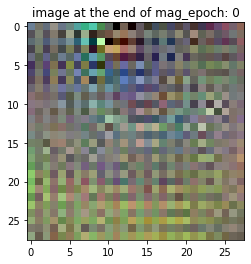

begin mag_epoch 1, activation: 9.030732154846191
end mag_epoch: 1, activation: 13.990876197814941


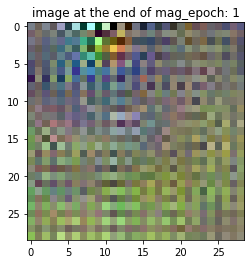

begin mag_epoch 2, activation: 8.378766059875488
end mag_epoch: 2, activation: 14.563034057617188


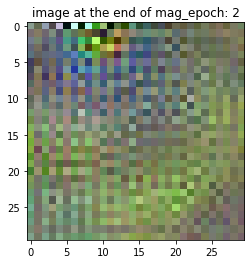

begin mag_epoch 3, activation: 4.997082233428955
end mag_epoch: 3, activation: 9.016840934753418


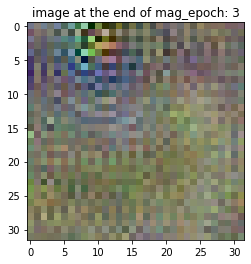

begin mag_epoch 4, activation: 5.942230701446533
end mag_epoch: 4, activation: 10.164003372192383


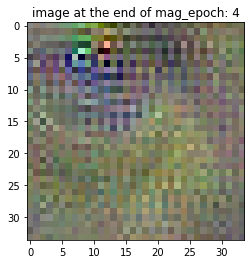

begin mag_epoch 5, activation: 6.314637660980225
end mag_epoch: 5, activation: 10.362320899963379


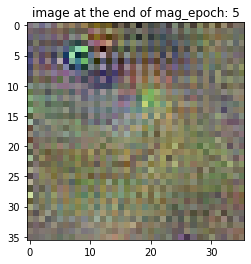

begin mag_epoch 6, activation: 6.411839962005615
end mag_epoch: 6, activation: 11.371899604797363


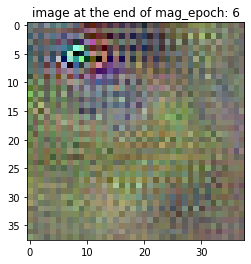

begin mag_epoch 7, activation: 6.755527019500732


In [ ]:
unit_idx = 225 # the neuron to visualize
act_wt = 0.5 # factor by which to weigh the activation relative to the regulizer terms

upscaling_steps = 45 # no. of times to upscale
upscaling_factor = 1.05
optim_steps = 100 # no. of times to optimize an input image before upscaling


model.eval()
for mag_epoch in range(upscaling_steps+1):
    optimizer = optim.Adam([img_tensor], lr = 0.4)
    
    for opt_epoch in range(optim_steps):
        optimizer.zero_grad()
        model(img_tensor.unsqueeze(0))
        layer_out = activation['4a']
        rms = torch.pow((layer_out[0, unit_idx]**2).mean(), 0.5)
        # terminate if rms is nan
        if torch.isnan(rms):
            print('Error: rms was Nan; Terminating ...')
            sys.exit()
        
        # pixel intensity
        pxl_inty = torch.pow((img_tensor**2).mean(), 0.5)
        # terminate if pxl_inty is nan
        if torch.isnan(pxl_inty):
            print('Error: Pixel Intensity was Nan; Terminating ...')
            sys.exit()
            
        # image gradients
        im_grd = grad_loss(img_tensor, beta = 1, device = device)
        # terminate is im_grd is nan
        if torch.isnan(im_grd):
            print('Error: image gradients were Nan; Terminating ...')
            sys.exit()
        
        loss = -act_wt*rms + pxl_inty + im_grd        
        # print activation at the beginning of each mag_epoch
        if opt_epoch == 0:
            print('begin mag_epoch {}, activation: {}'.format(mag_epoch, rms))
        loss.backward()
        optimizer.step()
        
    # view the result of optimising the image
    print('end mag_epoch: {}, activation: {}'.format(mag_epoch, rms))
    img = image_converter(img_tensor)    
    plt.imshow(img)
    plt.title('image at the end of mag_epoch: {}'.format(mag_epoch))
    plt.show()
    
    img = cv2.resize(img, dsize = (0,0), 
                     fx = upscaling_factor, fy = upscaling_factor).transpose(2,0,1) # scale up and move the batch axis to be the first
    img_tensor = normalize(torch.from_numpy(img)).to(device).requires_grad_(True)

## Trial 7:  Training images that maximally activate the neurons

### Download Imagenet data

In [100]:
from torchvision import datasets

In [101]:
# define dataset transforms
transform = transforms.Compose([transforms.ToTensor(), normalize])

In [103]:
# download imagenet
imagenet = datasets.ImageNet('data', train = True, transform = transform)

RuntimeError: The archive ILSVRC2012_devkit_t12.tar.gz is not present in the root directory or is corrupted. You need to download it externally and place it in data.